**Vehicle Detection Project**

The goals / steps of this project are the following:

* Perform a Histogram of Oriented Gradients (HOG) feature extraction on a labeled training set of images and train a classifier Linear SVM classifier
* Optionally, you can also apply a color transform and append binned color features, as well as histograms of color, to your HOG feature vector. 
* Note: for those first two steps don't forget to normalize your features and randomize a selection for training and testing.
* Implement a sliding-window technique and use your trained classifier to search for vehicles in images.
* Run your pipeline on a video stream (start with the test_video.mp4 and later implement on full project_video.mp4) and create a heat map of recurring detections frame by frame to reject outliers and follow detected vehicles.
* Estimate a bounding box for vehicles detected.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
import glob

### Histogram of Oriented Gradients (HOG)

#### 1. Explain how (and identify where in your code) you extracted HOG features from the training images.
##### I started by reading in all the `vehicle` and `non-vehicle` images. 

In [2]:
cars = glob.glob('vehicles/*/*.png')
notcars = glob.glob('non-vehicles/*/*.png')
random_car_num = np.random.randint(0, len(cars), size=1)
random_noncar_num = np.random.randint(0, len(notcars), size=1)
car = cars[random_car_num[0]]
notcar = notcars[random_noncar_num[0]]

##### I then explored different color spaces and different `skimage.hog()` parameters (`orientations`, `pixels_per_cell`, and `cells_per_block`).  I grabbed random images from each of the two classes and displayed them to get a feel for what the `skimage.hog()` output looks like.


In [3]:
from skimage.feature import hog
from joblib import Parallel, delayed

# Define a function to return HOG features and visualization
def get_hog_features(img, 
                     orient, 
                     pix_per_cell, 
                     cell_per_block, 
                     vis=False, 
                     feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, 
                                  orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=True, 
                                  visualise=vis, 
                                  feature_vector=feature_vec, 
                                  block_norm='L2')
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, 
                       orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=True, 
                       visualise=vis, 
                       feature_vector=feature_vec, 
                       block_norm='L2')
        return features

#### 2. Explain how you settled on your final choice of HOG parameters.

##### I choose the current parameters by verifying that the data can be trained on different parameters to achieve accuracy.


##### Here is an example using the `YCrCb` color space and HOG parameters of `orientations=9`, `pixels_per_cell=(8, 8)` and `cells_per_block=(2, 2)`:

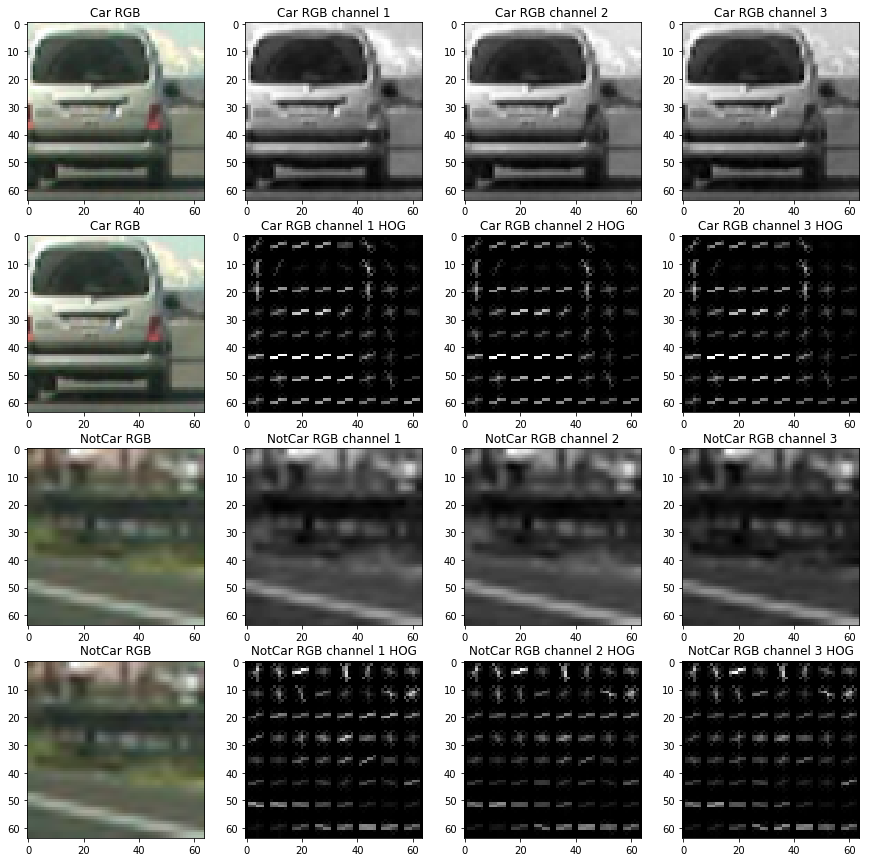

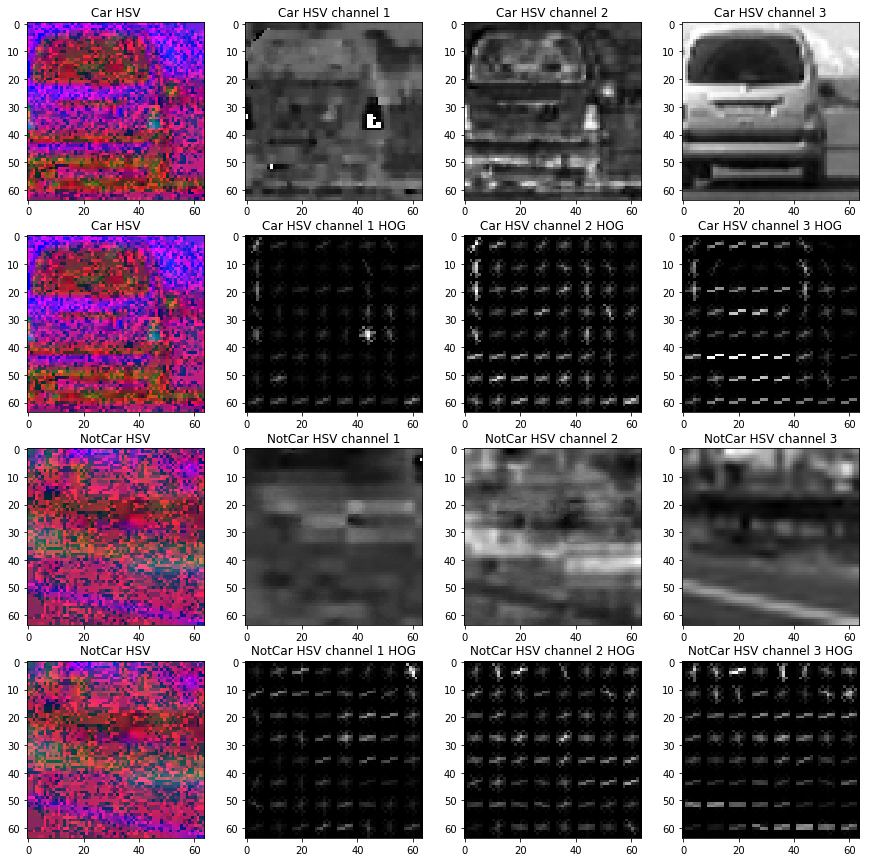

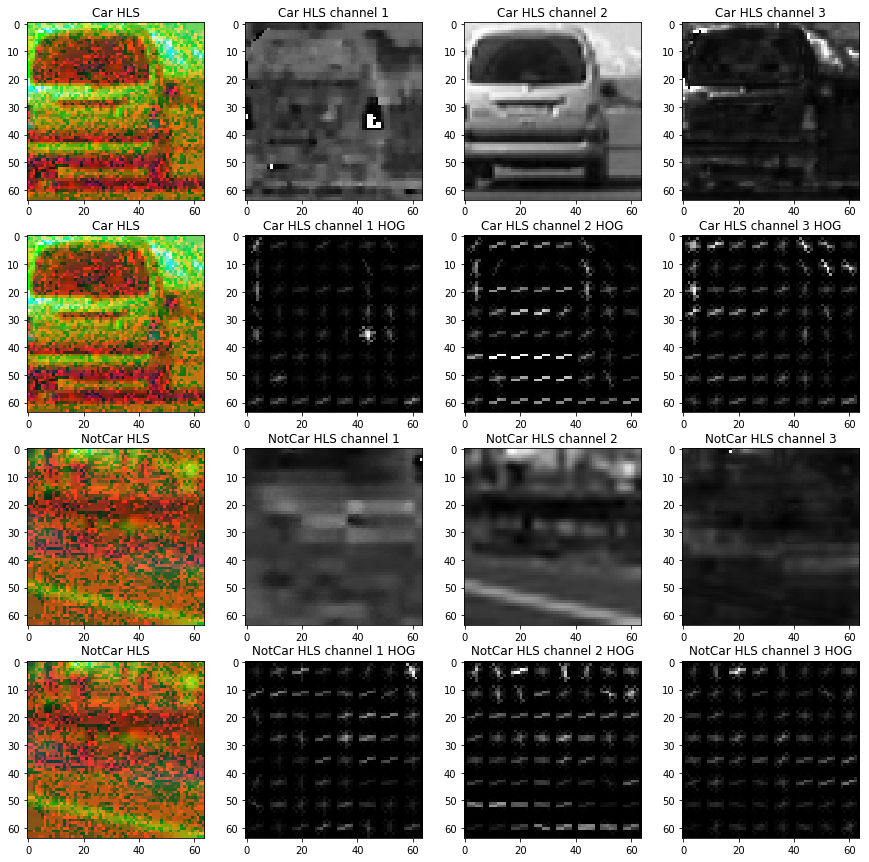

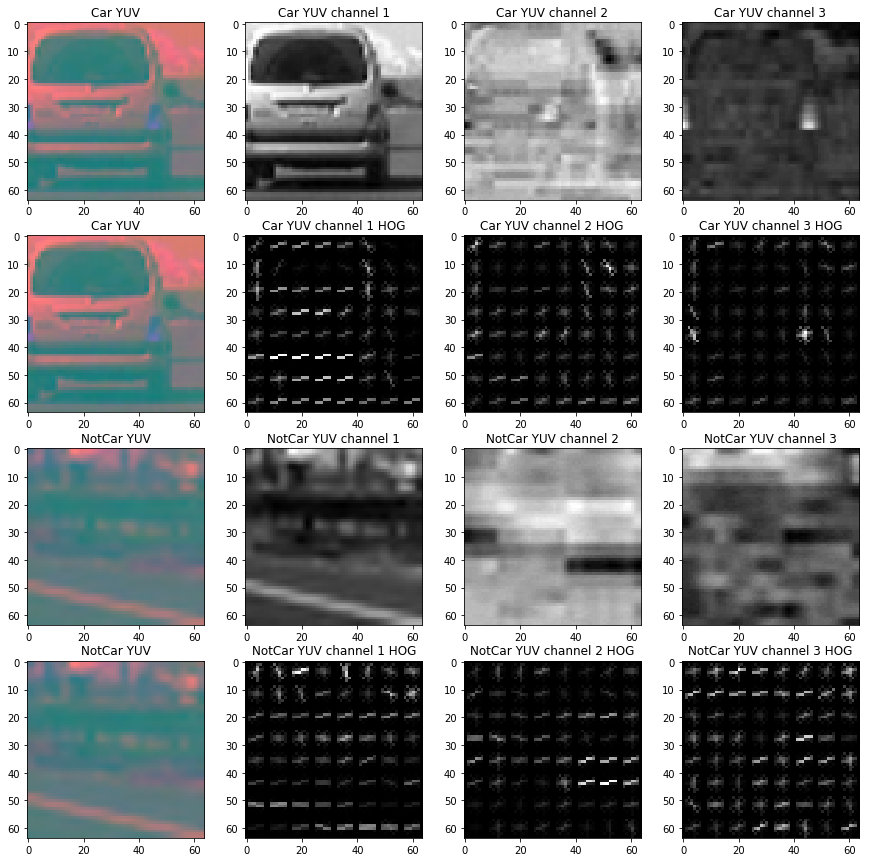

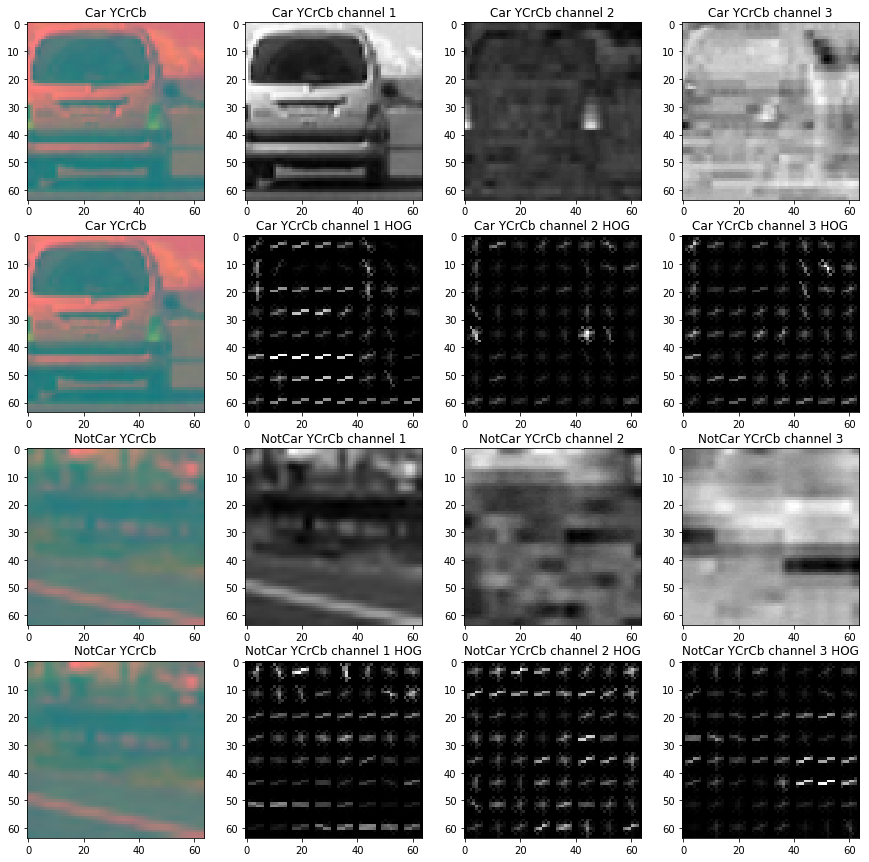

In [4]:
color_spaces = ['RGB', 'HSV', 'HLS', 'YUV', 'YCrCb']
orient = 9
pix_per_cell = 8
cell_per_block = 2

def get_hog_images(img):
    _, img1 = get_hog_features(img[:,:,0], orient, pix_per_cell, cell_per_block, vis=True)
    _, img2 = get_hog_features(img[:,:,1], orient, pix_per_cell, cell_per_block, vis=True)
    _, img3 = get_hog_features(img[:,:,2], orient, pix_per_cell, cell_per_block, vis=True)
    return img1, img2, img3
        

for color_space in color_spaces:
    car_image = mpimg.imread(car)
    notcar_image = mpimg.imread(notcar)
    if color_space != 'RGB':
        car_image = cv2.cvtColor(car_image, eval('cv2.COLOR_RGB2{}'.format(color_space)))
        notcar_image = cv2.cvtColor(notcar_image, eval('cv2.COLOR_RGB2{}'.format(color_space)))
    
    car_hog1, car_hog2, car_hog3 = get_hog_images(car_image)
    notcar_hog1, notcar_hog2, notcar_hog3 = get_hog_images(notcar_image)
    
    f, ax = plt.subplots(4, 4, figsize=(15, 15))
    ax[0][0].imshow(car_image)
    ax[0][0].set_title('Car {}'.format(color_space))
    ax[1][0].imshow(car_image)
    ax[1][0].set_title('Car {}'.format(color_space))
    ax[2][0].imshow(notcar_image)
    ax[2][0].set_title('NotCar {}'.format(color_space))
    ax[3][0].imshow(notcar_image)
    ax[3][0].set_title('NotCar {}'.format(color_space))
    
    ax[0][1].imshow(car_image[:,:,0], cmap='gray')
    ax[0][1].set_title('Car {} channel 1'.format(color_space))
    ax[1][1].imshow(car_hog1, cmap='gray')
    ax[1][1].set_title('Car {} channel 1 HOG'.format(color_space))
    ax[2][1].imshow(notcar_image[:,:,0], cmap='gray')
    ax[2][1].set_title('NotCar {} channel 1'.format(color_space))
    ax[3][1].imshow(notcar_hog1, cmap='gray')
    ax[3][1].set_title('NotCar {} channel 1 HOG'.format(color_space))
    
    ax[0][2].imshow(car_image[:,:,1], cmap='gray')
    ax[0][2].set_title('Car {} channel 2'.format(color_space))
    ax[1][2].imshow(car_hog2, cmap='gray')
    ax[1][2].set_title('Car {} channel 2 HOG'.format(color_space))
    ax[2][2].imshow(notcar_image[:,:,1], cmap='gray')
    ax[2][2].set_title('NotCar {} channel 2'.format(color_space))
    ax[3][2].imshow(notcar_hog2, cmap='gray')
    ax[3][2].set_title('NotCar {} channel 2 HOG'.format(color_space))
    
    ax[0][3].imshow(car_image[:,:,2], cmap='gray')
    ax[0][3].set_title('Car {} channel 3'.format(color_space))
    ax[1][3].imshow(car_hog3, cmap='gray')
    ax[1][3].set_title('Car {} channel 3 HOG'.format(color_space))
    ax[2][3].imshow(notcar_image[:,:,2], cmap='gray')
    ax[2][3].set_title('NotCar {} channel 3'.format(color_space))
    ax[3][3].imshow(notcar_hog3, cmap='gray')
    ax[3][3].set_title('NotCar {} channel 3 HOG'.format(color_space))
    
    plt.show()

#### 3. Describe how (and identify where in your code) you trained a classifier using your selected HOG features (and color features if you used them).

##### It seems that YCrCb is more suitable for the image HOG through the image on the upper side

In [5]:
class Features(object):
    def __init__(self,
                 color_space='RGB',
                 spatial_size=(32, 32),
                 hist_bins=32,
                 orient=9,
                 pix_per_cell=8,
                 cell_per_block=2,
                 hog_channel=0,
                 spatial_feat=True,
                 hist_feat=True,
                 hog_feat=True,
                 hist_range=(0, 256)):
        self.color_space = color_space
        self.spatial_size = spatial_size
        self.hist_bins = hist_bins
        self.orient = orient
        self.pix_per_cell = (pix_per_cell, pix_per_cell)
        self.cell_per_block = (cell_per_block, cell_per_block)
        self.hog_channel = hog_channel
        self.spatial_feat = spatial_feat
        self.hist_feat = hist_feat
        self.hog_feat = hog_feat
        self.hist_range = hist_range

    @staticmethod
    def get_feature_image(img, color_space='RGB'):
        if color_space != 'RGB':
            return cv2.cvtColor(img, eval('cv2.COLOR_RGB2{}'.format(color_space)))
        else:
            return np.copy(img)

    @staticmethod
    def get_single_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True):
        # Cell with two outputs if vis == True
        if vis == True:
            features, hog_image = hog(img,
                                      orientations=orient,
                                      pixels_per_cell=pix_per_cell,
                                      cells_per_block=cell_per_block,
                                      transform_sqrt=True,
                                      visualise=True,
                                      feature_vector=feature_vec,
                                      block_norm='L2')
            return features, hog_image
        # Otherwise call with one output
        else:
            features = hog(img,
                           orientations=orient,
                           pixels_per_cell=pix_per_cell,
                           cells_per_block=cell_per_block,
                           transform_sqrt=True,
                           visualise=False,
                           feature_vector=feature_vec,
                           block_norm='L2')
        return features

    def get_hog_features(self, img):
        if self.hog_channel == 'ALL':
            hog_features = []
            for channel in range(img.shape[2]):
                hog_features.append(self.get_single_hog_features(img[:, :, channel],
                                                                 orient=self.orient,
                                                                 pix_per_cell=self.pix_per_cell,
                                                                 cell_per_block=self.cell_per_block,
                                                                 vis=False
                                                                ))
            # hog_features = Parallel(n_jobs=-1)(delayed(self.get_single_hog_features)(img[:,:,x], vis=False)
            #                                    for x in range(img.shape[2]))
            hog_features = np.ravel(hog_features)
        else:
            hog_features = self.get_single_hog_features(img[:, :, self.hog_channel], 
                                                        orient=self.orient,
                                                        pix_per_cell=self.pix_per_cell,
                                                        cell_per_block=self.cell_per_block,
                                                        vis=False
                                                       )
        return hog_features

    # Define a function to compute binned color features
    @staticmethod
    def bin_spatial(img, spatial_size):
        c1 = cv2.resize(img[:, :, 0], spatial_size).ravel()
        c2 = cv2.resize(img[:, :, 1], spatial_size).ravel()
        c3 = cv2.resize(img[:, :, 2], spatial_size).ravel()
        return np.hstack((c1, c2, c3))

    # Define a function to compute color histogram features
    # Need to change bins_range if reading .png files whit mpimg
    @staticmethod
    def color_hist(img, nbins=32, bins_range=(0, 256)):
        # Compute the histogram of the color channels sparately
        c1_hist = np.histogram(img[:, :, 0], bins=nbins, range=bins_range)
        c2_hist = np.histogram(img[:, :, 1], bins=nbins, range=bins_range)
        c3_hist = np.histogram(img[:, :, 2], bins=nbins, range=bins_range)
        # hists = Parallel(n_jobs=-1)(delayed(np.histogram)(x, bins=nbins, range=bins_range)
        #                                     for x in [img[:,:,0], img[:,:,1], img[:,:2]])
        # Concatenate the histograms into a single feature vector
        hist_features = np.concatenate((c1_hist[0], c2_hist[0], c3_hist[0]))
        # hist_features = np.concatenate([i[0] for i in hists])
        # Return the individual histograms, bin_centers and feature vector
        return hist_features

    # Define a function to extarct features
    def extract_feature(self, img):
        file_features = []
        feature_image = self.get_feature_image(img, self.color_space)
        if self.spatial_feat == True:
            file_features.append(self.bin_spatial(feature_image, self.spatial_size))
        if self.hist_feat == True:
            file_features.append(self.color_hist(feature_image, bins_range=self.hist_range))
        if self.hog_feat == True:
            file_features.append(self.get_hog_features(feature_image))

        return np.concatenate(file_features)

In [6]:
color_space = 'YCrCb'  # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8  # HOG pixels per cell
cell_per_block = 2  # HOG cells per block
hog_channel = "ALL"  # Can be 0, 1, 2, or "ALL"
spatial_size = (32, 32)  # Spatial binning dimensions
hist_bins = 32  # Number of histogram bins
spatial_feat = True  # Spatial features on or off
hist_feat = True  # Histogram features on or off
hog_feat = True  # HOG features on or off
hist_range = (0, 256)  # histogram bins range

svc_pickle = 'svc_pickle.p' 

project_feature = Features(color_space=color_space,
                           orient=orient,
                           pix_per_cell=pix_per_cell,
                           cell_per_block=cell_per_block,
                           hog_channel=hog_channel,
                           spatial_size=spatial_size,
                           hist_bins=hist_bins,
                           spatial_feat=spatial_feat,
                           hist_feat=hist_feat,
                           hog_feat=hog_feat,
                           hist_range=hist_range)

## Train

##### I use sklearn.preprocessing.StandardScaler to standard the features and use sklearn.svm.LinearSVC to train them.

In [7]:
def get_features(file_list):
    file_features = []
    for img_file in file_list:
        # Image read and convert to RGB
        image = cv2.imread(img_file)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        # Append the extract features to the file features
        file_features.append(project_feature.extract_feature(image))
    return file_features

##### Get cars and notcars features

In [8]:

print('Getting Car Featues ...')
car_features = get_features(cars)
print('Getting Not Car Features ...')
notcar_features = get_features(notcars)

Getting Car Featues ...
Getting Not Car Features ...


## Training ...

In [9]:
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import pickle


X = np.vstack((car_features, notcar_features)).astype(np.float64)
X_scaler = StandardScaler().fit(X)
scaled_x = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

# Split up data into randomized training and test set
X_train, X_test, y_train, y_test = train_test_split(scaled_x, y, test_size=.2,
                                                    random_state=np.random.randint(0, 100))
svc = LinearSVC()
svc.fit(X_train, y_train)
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))

dist_pickle = {}
dist_pickle["svc"] = svc
dist_pickle["X_scaler"] = X_scaler
dist_pickle["orient"] = orient
dist_pickle["pix_per_cell"] = pix_per_cell
dist_pickle["cell_per_block"] = cell_per_block
dist_pickle["spatial_size"] = spatial_size
dist_pickle["hist_bins"] = hist_bins
dist_pickle["hist_range"] = hist_range
pickle.dump(dist_pickle, open(svc_pickle, 'wb'))

Test Accuracy of SVC =  0.9941


## Train END

### Sliding Window Search

##### Use the lesson function to find cars

In [10]:
def find_cars(img, 
              ystart, 
              ystop, 
              scale, 
              svc, 
              X_scaler, 
              orient, 
              pix_per_cell, 
              cell_per_block, 
              spatial_size, 
              hist_bins,
              hist_range
             ):
    
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YCrCb)
    if scale != 1: 
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step + 1
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step + 1
    
    # Compute individual channel HOG features for the entire image
    hog1 = project_feature.get_single_hog_features(ch1, 
                                                   orient, 
                                                   (pix_per_cell, pix_per_cell), 
                                                   (cell_per_block, cell_per_block), 
                                                   feature_vec=False)
    hog2 = project_feature.get_single_hog_features(ch2, 
                                                   orient, 
                                                   (pix_per_cell, pix_per_cell), 
                                                   (cell_per_block, cell_per_block), 
                                                   feature_vec=False)
    hog3 = project_feature.get_single_hog_features(ch3, 
                                                   orient, 
                                                   (pix_per_cell, pix_per_cell), 
                                                   (cell_per_block, cell_per_block), 
                                                   feature_vec=False)
    
    boxes = list()
    for xb in range(nxsteps):
        xpos = xb*cells_per_step
        xleft = xpos*pix_per_cell
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            ytop = ypos*pix_per_cell
            
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = project_feature.bin_spatial(subimg, spatial_size=spatial_size)
            hist_features = project_feature.color_hist(subimg, nbins=hist_bins, bins_range=hist_range)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                boxes.append([(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)])
                
    return boxes

#### 1. Describe how (and identify where in your code) you implemented a sliding window search.

##### I used height from 400 to 656 area to search for paddling, in this area use the diffent scales to sliding.

[[0.8 0.9]
 [1.  1.1]
 [1.2 1.3]
 [1.4 1.5]
 [1.6 1.7]
 [1.8 1.9]
 [2.  2.1]
 [2.2 2.3]
 [2.4 2.5]
 [2.6 2.7]
 [2.8 2.9]
 [3.  3.1]]


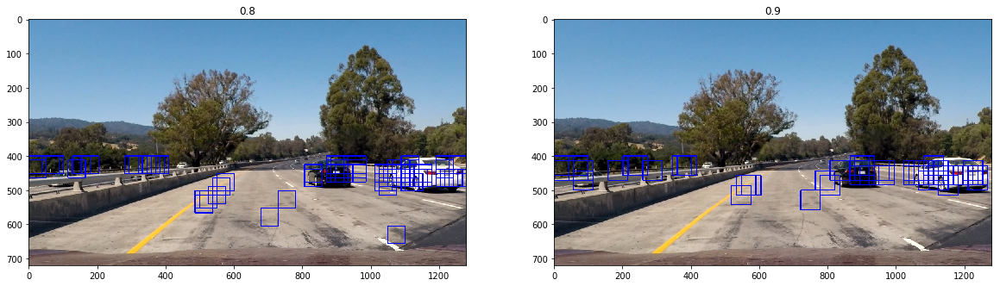

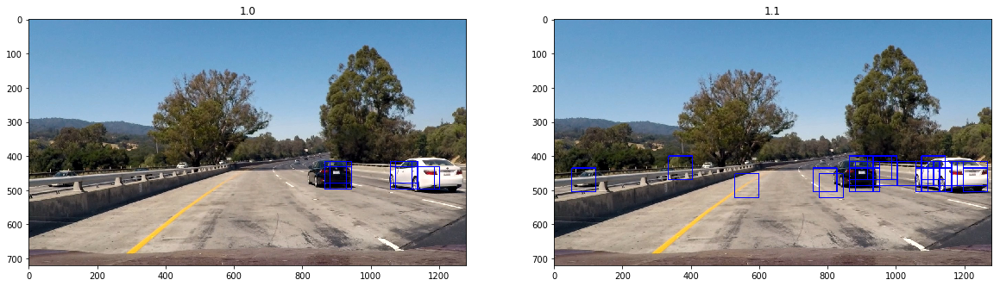

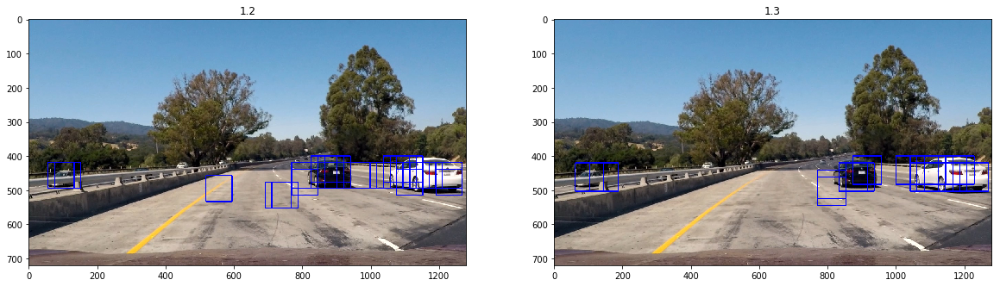

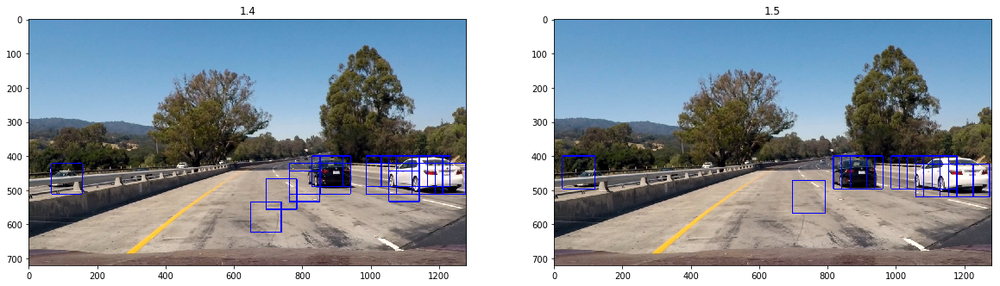

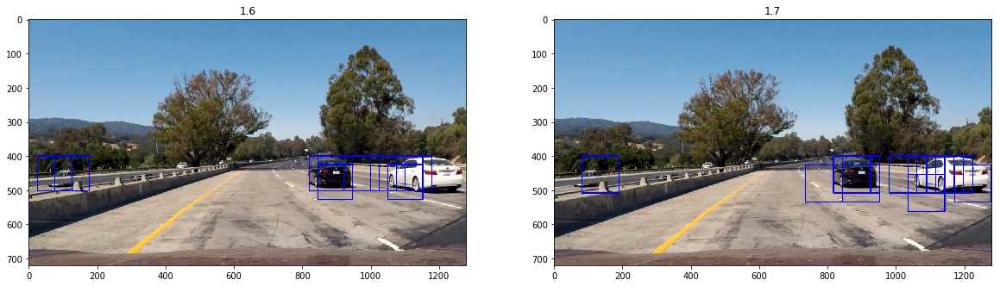

...

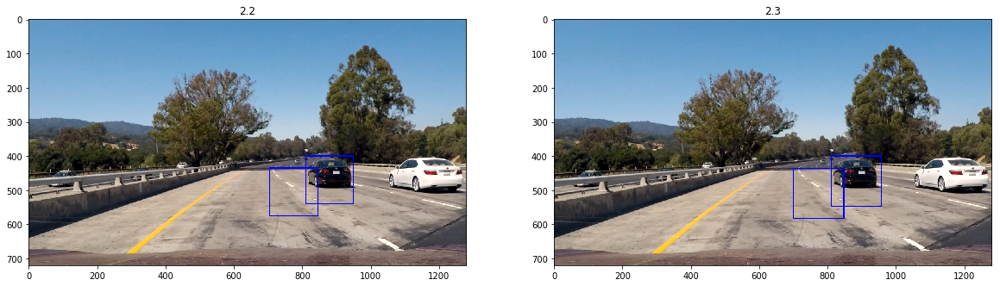

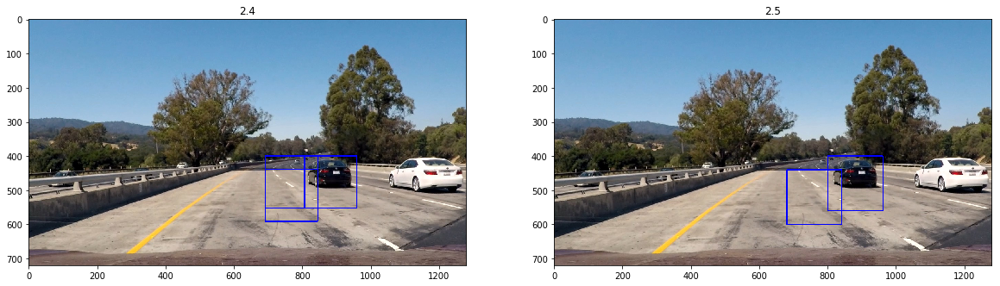

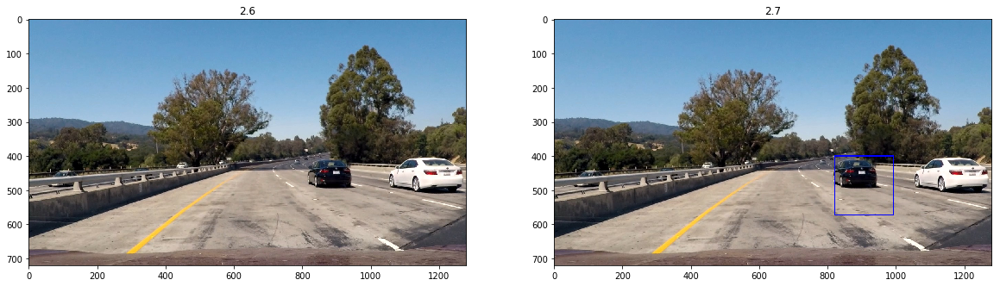

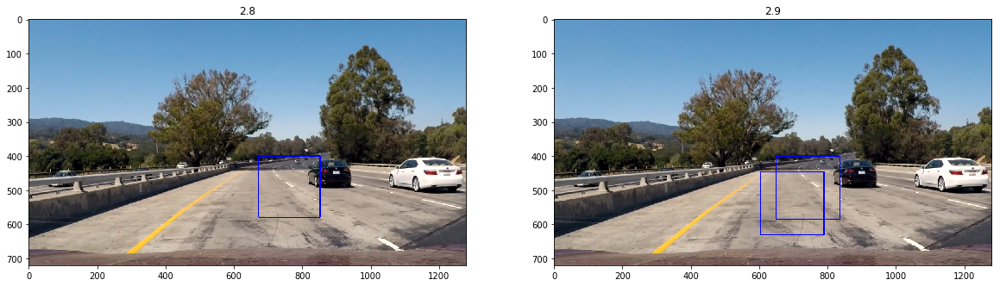

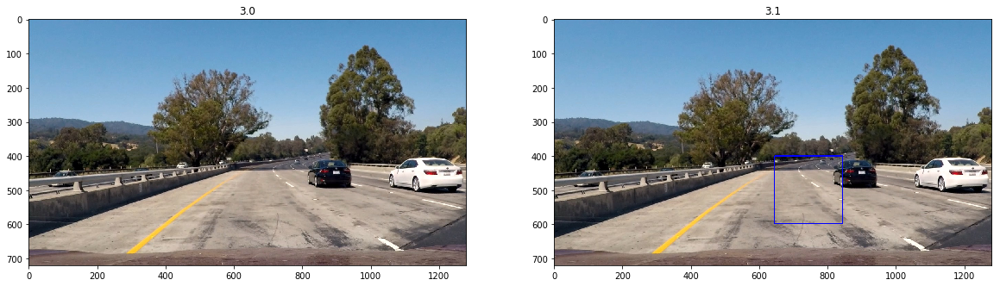

In [11]:
import pickle


svc_pickle = 'svc_pickle.p'
dist_pickle = pickle.load(open(svc_pickle, 'rb'))


def show_boxes(image, scales):
    f, axs = plt.subplots(1, 2, figsize=(20, 10))
    for i, scale in enumerate(scales):
        bboxes = list()
        img = np.copy(image)
        boxes = find_cars(image, 400, 656, scale, **dist_pickle)
        bboxes.extend(boxes)
        for box in bboxes:
            cv2.rectangle(img, box[0], box[1], (0, 0, 255), 2)
        axs[i].imshow(img)
        axs[i].set_title(scale)
    plt.show()

scale_lists = [x / 10 for x in range(8, 32)]
scale_lists = np.array(scale_lists).reshape(12, 2)

image = mpimg.imread('test_images/test1.jpg')

print(scale_lists)

for scales in scale_lists:
    show_boxes(image, scales)



##### Use Less Scales

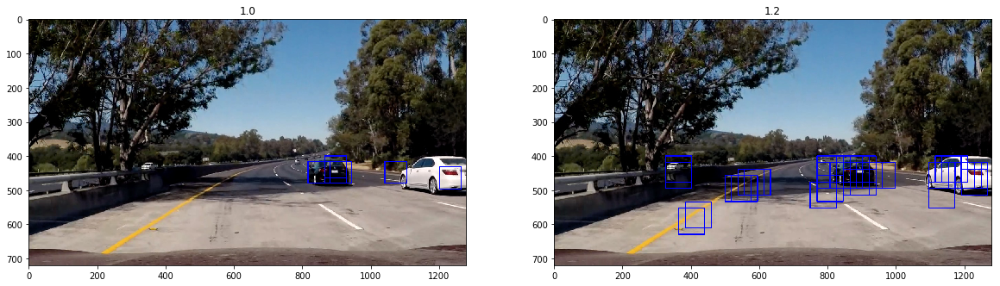

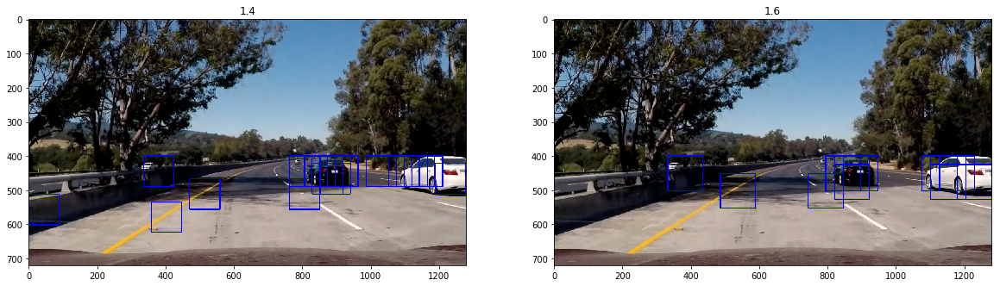

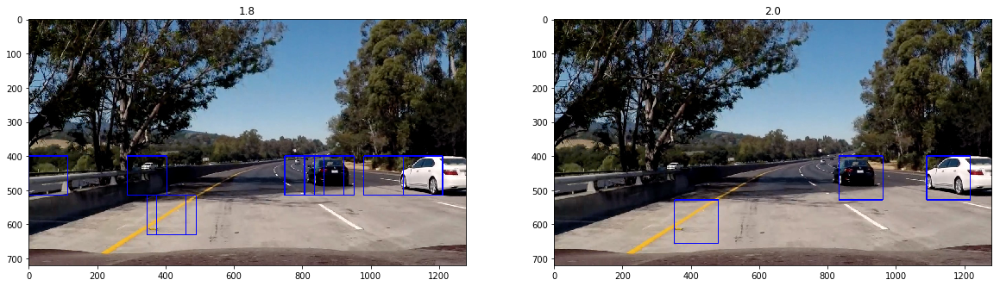

In [12]:
scale_lists = [1.0, 1.3, 1.4, 1.8, 1.9, 2.0, 2.4]
scale_lists = np.array(scale_lists).reshape(3, 2)

image = mpimg.imread('test_images/test5.jpg')

for scales in scale_lists:
    show_boxes(image, scales)


#### Combined scales for image rendering

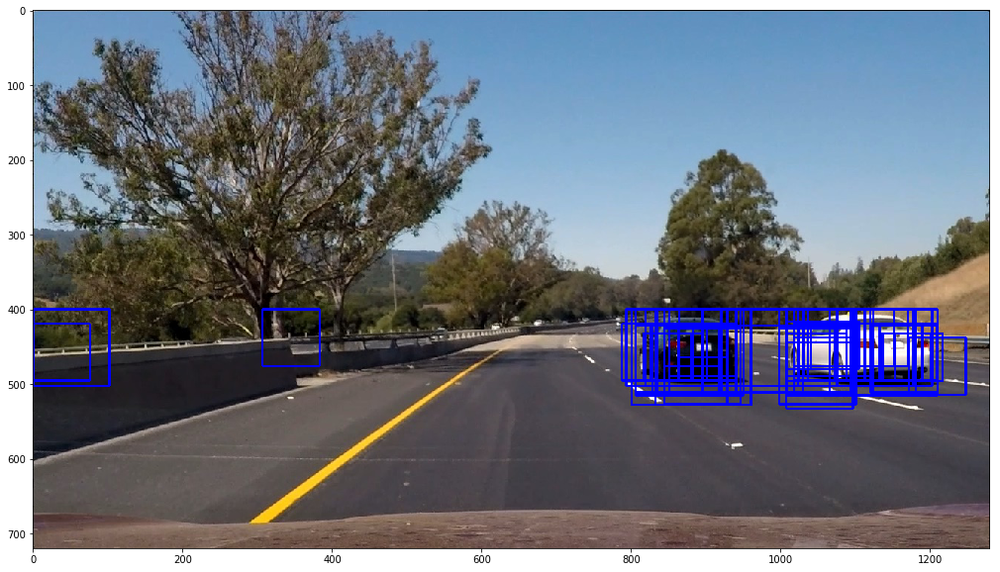

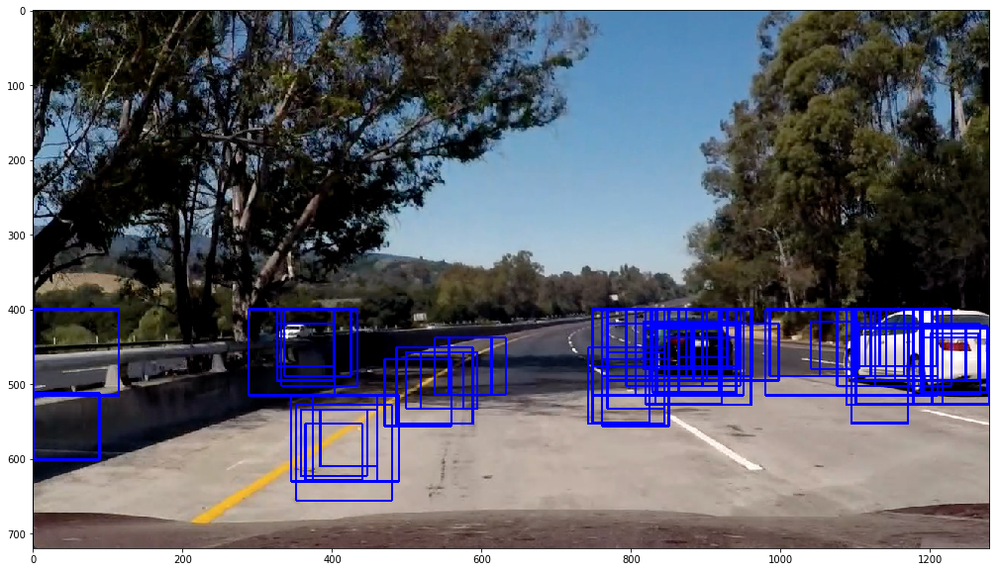

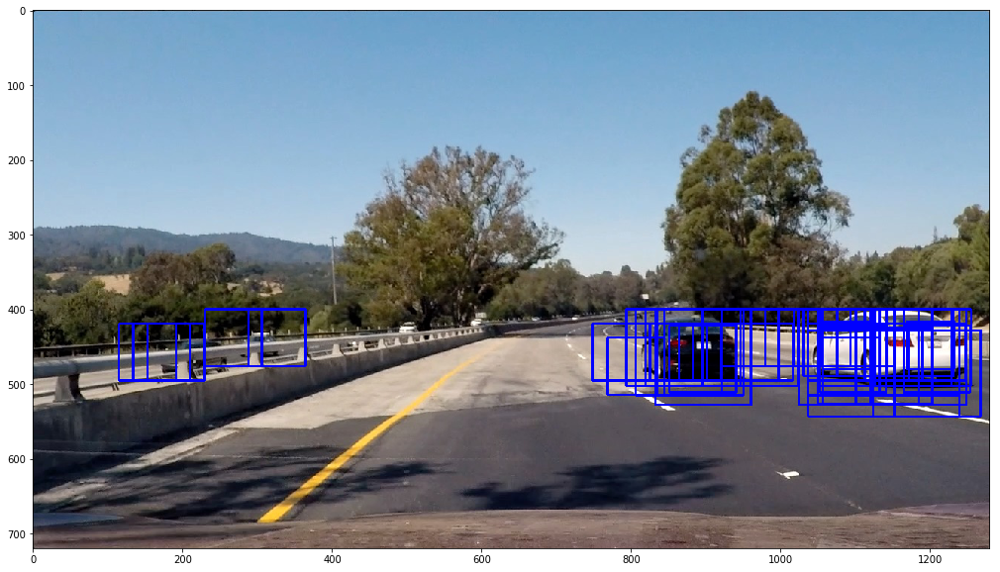

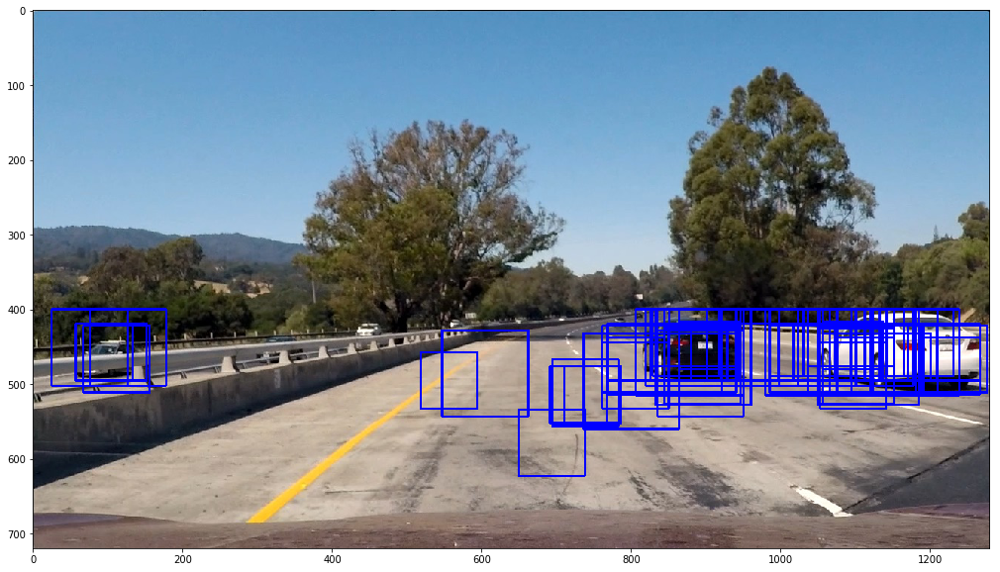

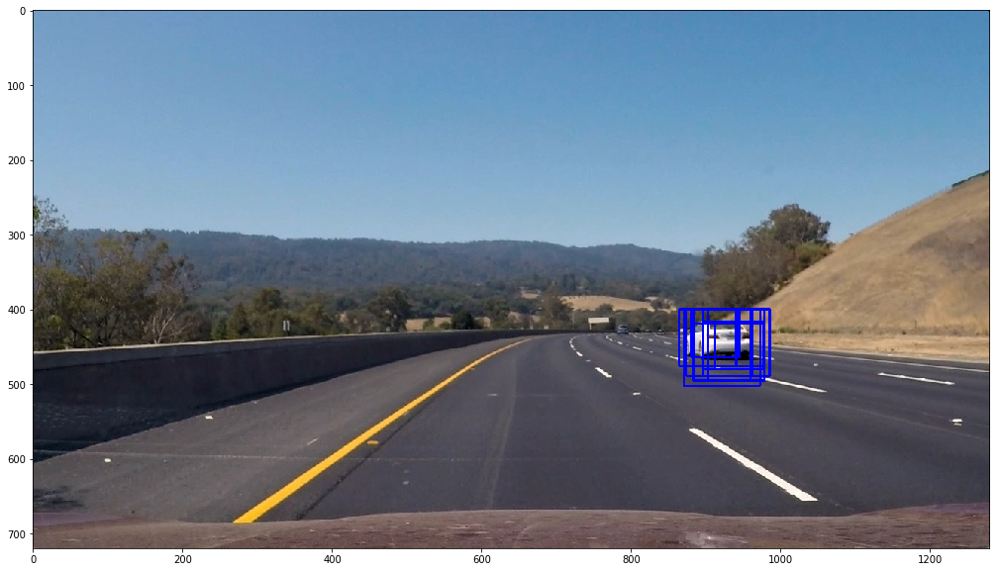

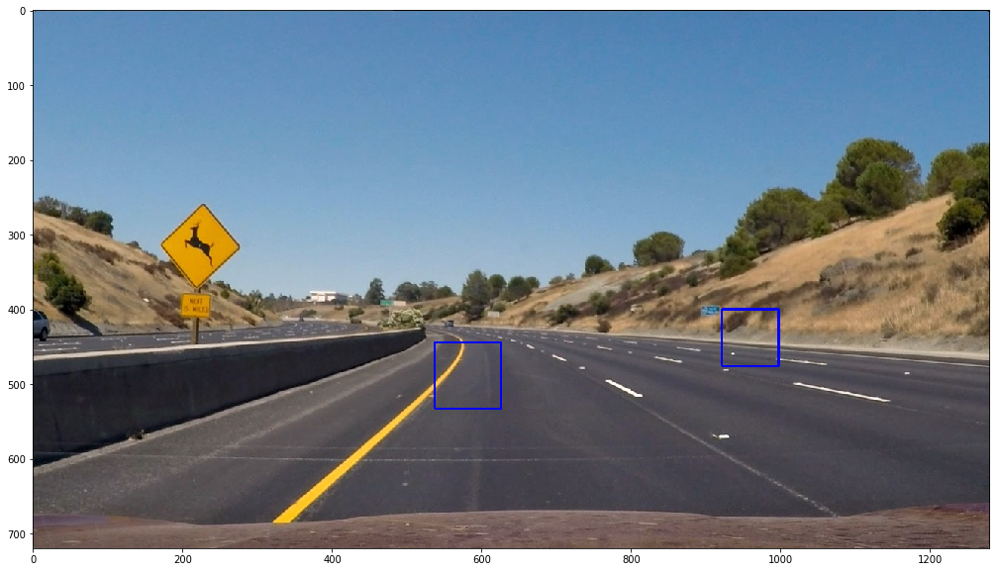

In [13]:
for test_image in glob.glob('test_images/*.jpg'):
    image = mpimg.imread(test_image)
    scale_lists = [1.0, 1.3, 1.4, 1.8, 1.9, 2.0, 2.4]
    bboxes = list()
    for scale in scale_lists:
        img = np.copy(image)
        boxes = find_cars(img, 400, 656, scale, **dist_pickle)
        bboxes.extend(boxes)
    for box in bboxes:
        cv2.rectangle(image, box[0], box[1], (0, 0, 255), 2)
    plt.figure(figsize=(20, 10))
    plt.imshow(image)
    plt.show()

#### Draw Heatmap Use threshhold 5

In [14]:
def test_get_heatmap(image, bboxes, threshhold):
    """
    Create the heatmap
    """
    heatmap = np.zeros_like(image[:, :, 0]).astype(np.float)
    for box in bboxes:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" taks the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Zero out pixels below the threshhold
    heatmap[heatmap <= threshhold] = 0
    current_heatmap = np.clip(heatmap, 0, 255)
    return current_heatmap

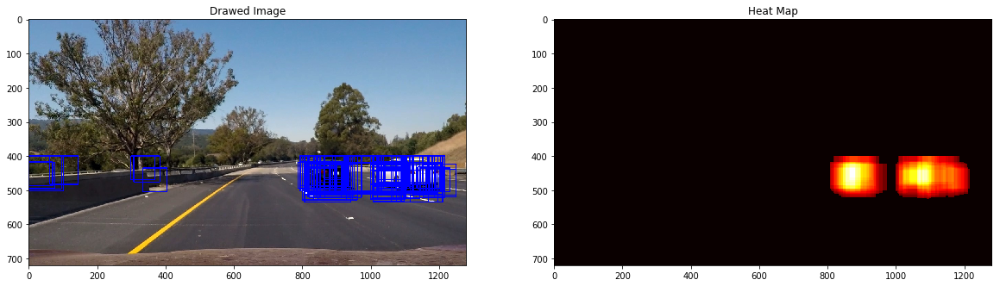

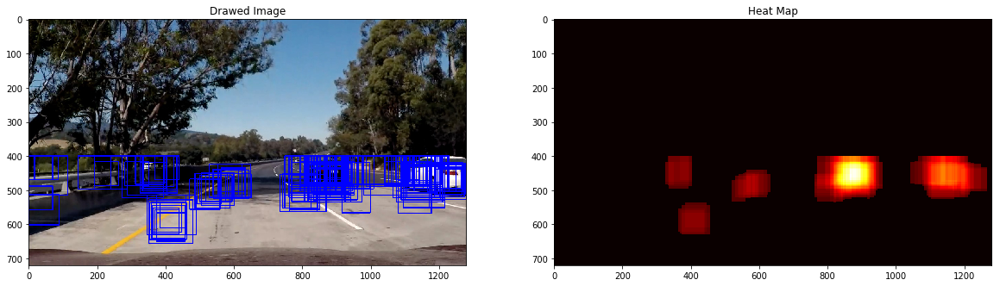

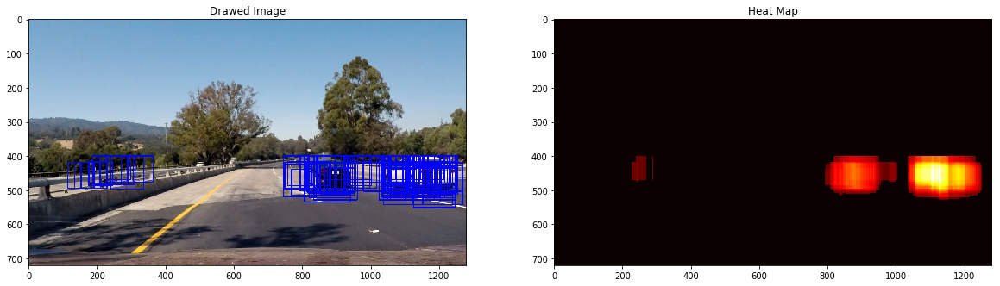

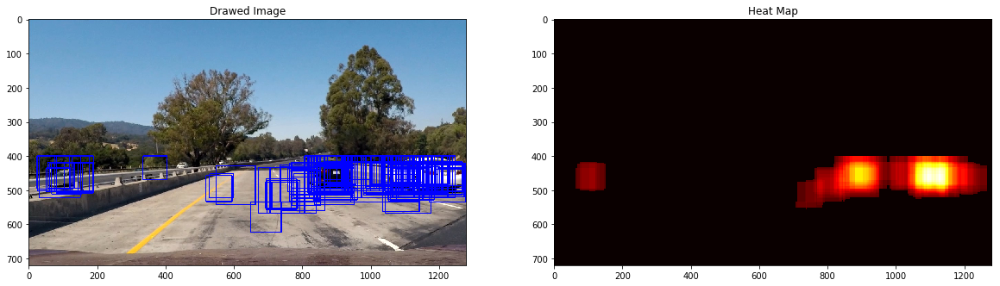

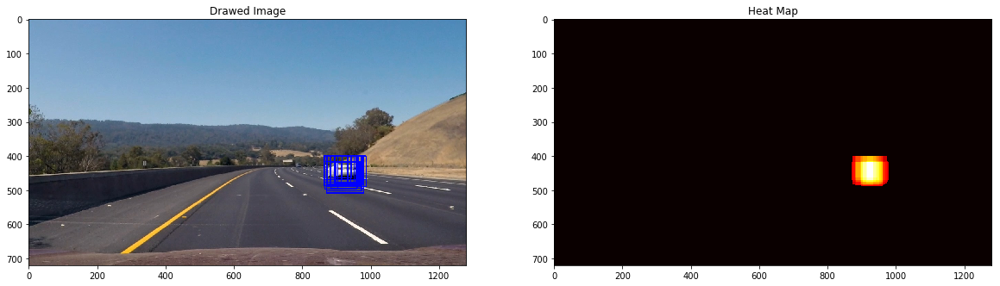

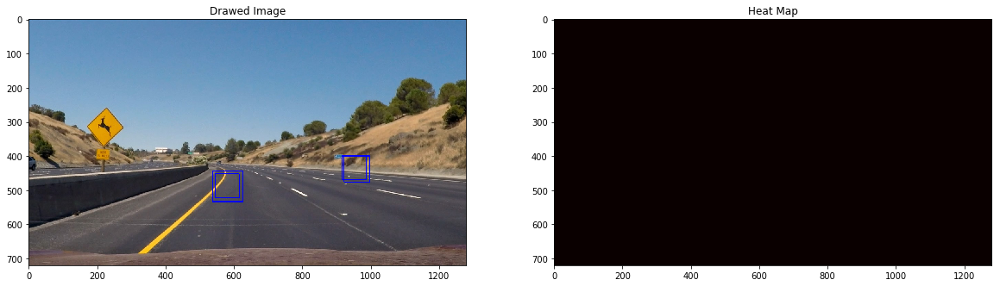

In [24]:
threshhold = 5

for test_image in glob.glob('test_images/*.jpg'):
    image = mpimg.imread(test_image)
    scale_lists = [1.0, 1.3, 1.4, 1.8, 1.9, 2.0, 2.4]
    bboxes = list()
    for scale in scale_lists:
        img = np.copy(image)
        boxes = find_cars(img, 400, 656, scale, **dist_pickle)
        bboxes.extend(boxes)
    for box in bboxes:
        cv2.rectangle(image, box[0], box[1], (0, 0, 255), 2)
    
    heat = test_get_heatmap(image, bboxes, threshhold)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    ax1.imshow(image)
    ax1.set_title('Drawed Image')
    ax2.imshow(heat, cmap='hot')
    ax2.set_title('Heat Map')
    plt.show()

#### I used `scipy.ndimage.measurements.label()` to identify individual blobs in the heatmap.  I then assumed each blob corresponded to a vehicle.  I constructed bounding boxes to cover the area of each blob detected.  

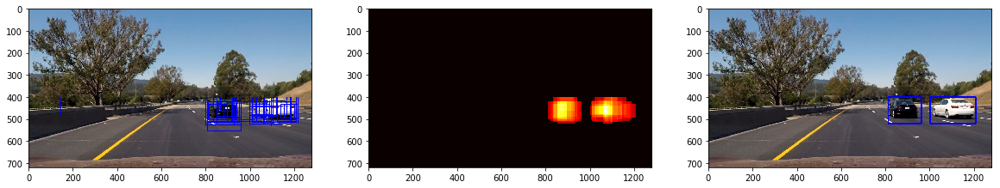

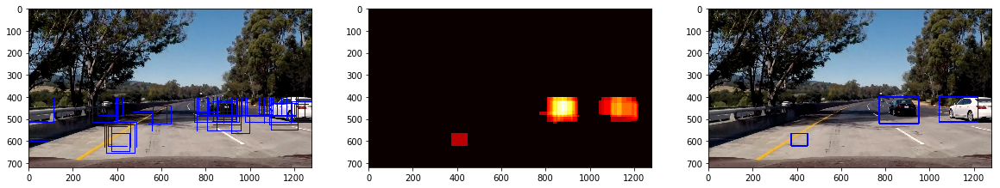

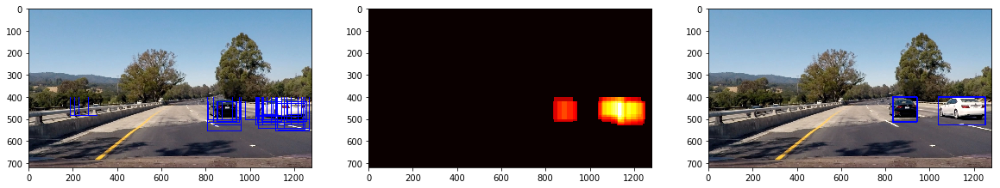

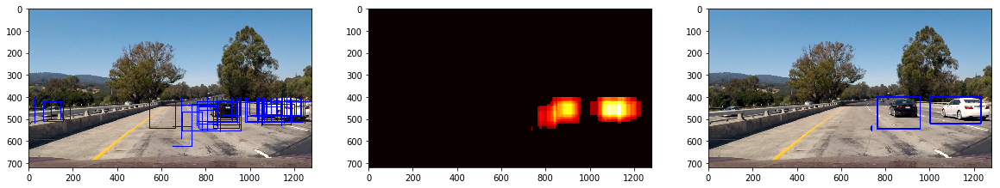

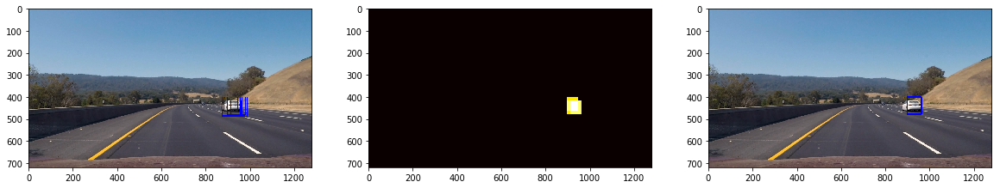

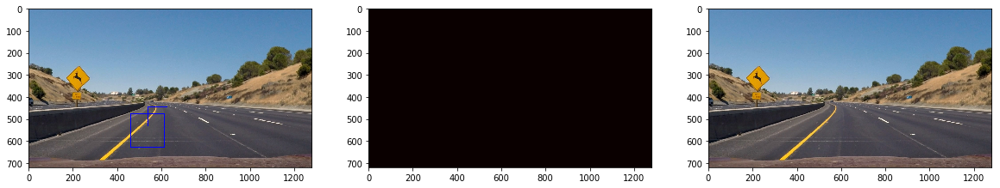

In [29]:
from scipy.ndimage.measurements import label

def draw_labeled_bboxs(image, heat):
    """
    Draw the car box from the heatmap labels
    """
    lables = label(heat)
    for car_number in range(1, lables[1] + 1):
        # Find pixels with eatch car_number label value
        nonzero = (lables[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box base on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(image, bbox[0], bbox[1], (0, 0, 255), 6)

    return image

threshhold = 5

for test_image in glob.glob('test_images/*.jpg'):
    image = mpimg.imread(test_image)
    scale_lists = [1.0, 1.3, 1.4, 1.8, 1.9, 2.0, 2.4]
    bboxes = list()
    cimage = np.copy(image)
    for scale in scale_lists:
        img = np.copy(cimage)
        boxes = find_cars(img, 400, 656, scale, **dist_pickle)
        bboxes.extend(boxes)
    for box in bboxes:
        cv2.rectangle(cimage, box[0], box[1], (0, 0, 255), 2)
    
    heat = test_get_heatmap(image, bboxes, threshhold)
    label_image = draw_labeled_bboxs(image, heat)
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
    ax1.imshow(cimage)
    ax2.imshow(heat, cmap='hot')
    ax3.imshow(label_image)
    plt.show()

##### Add Store Queue to heatmap for get the heat historical rules

In [30]:
def get_heatmap(image, bboxes, threshhold, store_queue):
    """
    Create the heatmap
    """
    heatmap = np.zeros_like(image[:, :, 0]).astype(np.float)
    for box in bboxes:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" taks the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Zero out pixels below the threshhold
    heatmap[heatmap <= threshhold] = 0
    current_heatmap = np.clip(heatmap, 0, 255)
    store_queue.append(current_heatmap)
    heat = np.zeros_like(current_heatmap).astype(np.float32)
    for _ in store_queue:
        heat += _
    return heat


### PipeLine the video image input and output the drawed image

In [31]:
from collections import deque

class PipeLine(object):
    def __init__(self, threshhold, scale_lists, y_start, y_stop):
        self.threshhold = threshhold
        self.scale_lists = scale_lists
        self.queue = deque(maxlen=10)
        self.y_start = y_start
        self.y_stop = y_stop
    
    def run(self, image):
        bboxes = list()
        img = np.copy(image)
        for scale in self.scale_lists:
            boxes = find_cars(image, self.y_start, self.y_stop, scale, **dist_pickle)
            bboxes.extend(boxes)

        heat = get_heatmap(img, bboxes, self.threshhold, self.queue)
        label_image = draw_labeled_bboxs(img, heat)
        return label_image

#### Test Pipeline 

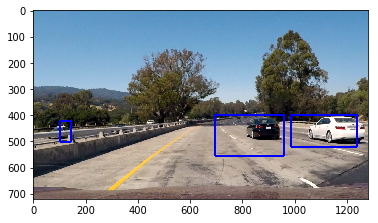

In [32]:
threshhold = 3
y_start = 400
y_stop = 656
scale_lists = [1.0, 1.3, 1.4, 1.8, 1.9, 2.0, 2.4]

image = mpimg.imread('test_images/test1.jpg')
pipeline = PipeLine(threshhold, scale_lists, y_start, y_stop).run
plt.imshow(pipeline(image), cmap='hot')
plt.show()

### Test output the test video

In [33]:
from moviepy.editor import VideoFileClip

threshhold = 6
y_start = 400
y_stop = 656
scale_lists = [x / 10 for x in range(10, 22, 2)]

pipeline = PipeLine(threshhold, scale_lists, y_start, y_stop)

test_project_output = 'test_video_output.mp4'
test_clip = VideoFileClip('test_video.mp4')
test_project_clip = test_clip.fl_image(pipeline.run)
test_project_clip.write_videofile(test_project_output, audio=False)

[MoviePy] >>>> Building video test_video_output.mp4
[MoviePy] Writing video test_video_output.mp4


 97%|█████████▋| 38/39 [02:09<00:03,  3.45s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_video_output.mp4 



In [34]:
from IPython.display import HTML

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(test_project_output))

## Project Video Ouptput

In [35]:
project_output = 'project_video_output.mp4'
clip = VideoFileClip('project_video.mp4')
project_clip = clip.fl_image(pipeline.run)
project_clip.write_videofile(project_output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [1:18:07<00:03,  3.35s/it] 


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 



In [36]:
from IPython.display import HTML

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))